# Request Parameters

In [56]:
import requests
import pandas as pd

In [57]:
swid = '{8C534F54-D122-4AFC-B367-F9E567499C72}'
espn_s2 = 'AEBf9SBGkjrGBJ%2BUVOlNWS%2BnMrWE4WcbgTOzv4GBc7K19WGPMCG1K4bMUDb1vldCFmmQupRbEWY%2BxDpbQCfKJFiwkQ4NoRLnvib7JRKIJrBKn3GTvTZGk8CjJXRUo%2BcTEudED%2B6hL699y%2BNe1uqYK2i4Vmeiow1poOvVZVkDIVOUcUsMbyPTzH7UPbvrC6jgc4OyZWwTet7C4fjT0rSfrEVxQOO6lndKCdlW8t9NtQfgUZ6COk14vZRZudEHVU5j0qkBoJvMitRZYrD1yU9xvZO4Q4wfLalc5wITUl7KpguFXYfESQbPktTT6%2BR36JtEx2A%3D'

In [58]:
league_id = '708983404'
season = '2024'
week = 1

In [59]:
url = 'https://lm-api-reads.fantasy.espn.com/apis/v3/games/ffl/seasons/{}/segments/0/leagues/{}?view=mMatchup&view=mMatchupScore'.format(season, league_id)

In [60]:
r = requests.get(url,
                params={'scoringPeriodId': week},
                cookies={"SWID": swid, "espn_s2": espn_s2})
espn_raw_data = r.json()

In [61]:
espn_raw_data

{'draftDetail': {'drafted': True, 'inProgress': False},
 'gameId': 1,
 'id': 708983404,
 'schedule': [{'away': {'adjustment': 0.0,
    'cumulativeScore': {'losses': 0,
     'scoreByStat': {'128': {'ineligible': False,
       'rank': 0.0,
       'result': None,
       'score': 0.0},
      '129': {'ineligible': False, 'rank': 0.0, 'result': None, 'score': 0.0},
      '130': {'ineligible': False, 'rank': 0.0, 'result': None, 'score': 0.0},
      '3': {'ineligible': False, 'rank': 0.0, 'result': None, 'score': 217.0},
      '4': {'ineligible': False, 'rank': 0.0, 'result': None, 'score': 1.0},
      '132': {'ineligible': False, 'rank': 0.0, 'result': None, 'score': 1.0},
      '133': {'ineligible': False, 'rank': 0.0, 'result': None, 'score': 0.0},
      '134': {'ineligible': False, 'rank': 0.0, 'result': None, 'score': 0.0},
      '198': {'ineligible': False, 'rank': 0.0, 'result': None, 'score': 3.0},
      '135': {'ineligible': False, 'rank': 0.0, 'result': None, 'score': 0.0},
      '7

# Saving JSON Response to a Pandas Dataframe

## Accessing Nested JSON Data

In [62]:
columns = ['Team',
          'Player',
          'Slot',
          'Position',
          'Projected',
          'Actual']

In [63]:
# my team_id
team = espn_raw_data['teams'][5]
team_id = team['id']
print(team_id)

6


In [64]:
team_abbrev = {
    1: 'ZACH',
    2: 'BBQ',
    3: 'LG',
    4: 'ALEX',
    5: 'HZSB',
    6: 'JEFFREY',
    7: 'HOT',
    8: 'BUG',
    9: 'FEF',
    10: 'DAVID',
    
}

In [65]:
# me
team_owner = team_abbrev[team_id]
print(team_owner)

JEFFREY


In [66]:
# loop over every player on the team roster
for player in team['roster']['entries']:
    print(player['playerPoolEntry']['player']['fullName'])
    print(player['lineupSlotId'])

CeeDee Lamb
4
Kyren Williams
2
Nico Collins
4
De'Von Achane
2
Jaylen Waddle
23
Kyle Pitts
6
Jayden Daniels
0
Tank Dell
20
Diontae Johnson
20
Chase Brown
20
Hollywood Brown
20
Zach Charbonnet
20
Khalil Shakir
20
Blake Corum
20
Evan McPherson
17
Bengals D/ST
16


In [67]:
eligible_positions = {
    0: 'QB',
    2: 'RB',
    4: 'WR',
    6: 'TE',
    16: 'D/ST',
    17: 'K',
    20: 'Bench',
    21: 'IR',
    23: 'Flex'
}

In [68]:
# loop over every player on the team roster
for player in team['roster']['entries']:
    print(player['playerPoolEntry']['player']['fullName'])
    print(player['lineupSlotId'])
    lineup_slot = player['lineupSlotId']
    print(eligible_positions[lineup_slot])

CeeDee Lamb
4
WR
Kyren Williams
2
RB
Nico Collins
4
WR
De'Von Achane
2
RB
Jaylen Waddle
23
Flex
Kyle Pitts
6
TE
Jayden Daniels
0
QB
Tank Dell
20
Bench
Diontae Johnson
20
Bench
Chase Brown
20
Bench
Hollywood Brown
20
Bench
Zach Charbonnet
20
Bench
Khalil Shakir
20
Bench
Blake Corum
20
Bench
Evan McPherson
17
K
Bengals D/ST
16
D/ST


## Projected & Actual Points

In [69]:
# for a single player
team = espn_raw_data['teams'][5]
player = team['roster']['entries'][0]
player_name = player['playerPoolEntry']['player']['fullName']
print(player_name)

CeeDee Lamb


In [70]:
for stats in player['playerPoolEntry']['player']['stats']:
    # skip rows where scoring period does not match up with the current week
    if stats['scoringPeriodId'] != week:
        continue
    # source id = 0 -> these are Actual stats
    if stats['statSourceId'] == 0:
        actual = stats['appliedTotal']
    # source id = 1 -> these are Projected stats
    elif stats['statSourceId'] == 1:
        projected = stats['appliedTotal']
print(player_name)
print(actual)
print(projected)


CeeDee Lamb
13.6
20.29536225


In [71]:
team = espn_raw_data['teams'][5]
for player in team['roster']['entries']:
    player_name = player['playerPoolEntry']['player']['fullName']
    # get projected & actual points
    projected = None
    actual = None
    # loop over the stats for each player
    for stats in player['playerPoolEntry']['player']['stats']:
        # skip rows where scoring period does not match up with the current week
        if stats['scoringPeriodId'] != week:
            continue
        # source id = 0 -> these are Actual stats
        if stats['statSourceId'] == 0:
            actual = stats['appliedTotal']
        # source id = 1 -> these are Projected stats
        elif stats['statSourceId'] == 1:
            projected = stats['appliedTotal']
    print(player_name)
    print(actual)
    print(projected)

CeeDee Lamb
13.6
20.29536225
Kyren Williams
14.4
15.68710845
Nico Collins
17.7
14.47650994
De'Von Achane
23.0
13.99223203
Jaylen Waddle
16.2
13.73633227
Kyle Pitts
11.6
10.41623362
Jayden Daniels
28.16
19.95583339
Tank Dell
8.9
13.38525522
Diontae Johnson
3.9
13.34360054
Chase Brown
5.3
11.33036562
Hollywood Brown
0.0
0.0
Zach Charbonnet
12.1
8.85899953
Khalil Shakir
13.2
9.33819051
Blake Corum
0.0
5.68933994
Evan McPherson
6.0
8.35343646
Bengals D/ST
4.0
7.85513015


In [72]:
# create a list to append data to
projection_data = []

for week in range(1, 18): # week 18 games have not yet been played by the time I write this
    print('Week', week)
    
    # get the raw data
    r = requests.get(url,
                params={'scoringPeriodId': week},
                cookies={"SWID": swid, "espn_s2": espn_s2})
    espn_raw_data = r.json()
    
    # loop over each team in the request
    for team in espn_raw_data['teams']:
        # get team_id so we can map it to team_name
        team_id = team['id']
        # create a new col with the team_abbrev using the team_id as the key
        team_owner = team_abbrev[team_id]
        # loop every player on the teams roster
        for player in team['roster']['entries']:
            player_name = player['playerPoolEntry']['player']['fullName']
            lineup_slot = player['lineupSlotId']
            # create a new column with the position using the lineup_slot as the key
            position = eligible_positions[lineup_slot]
            
            # get projected and actual points
            projected = None
            actual = None
            # loop over the stats for each player
            for stats in player['playerPoolEntry']['player']['stats']:
                # skip rows where scoring period does not match up with the current week
                if stats['scoringPeriodId'] != week:
                    continue
                # source id = 0 -> these are Actual stats
                if stats['statSourceId'] == 0:
                    actual = stats['appliedTotal']
                # source id = 1 -> these are Projected stats
                elif stats['statSourceId'] == 1:
                    projected = stats['appliedTotal']
                    
            # append all the data to the list
            projection_data.append([
                week,
                team_owner,
                player_name,
                lineup_slot,
                position,
                projected,
                actual
            ])
print('Done')        

Week 1
Week 2
Week 3
Week 4
Week 5
Week 6
Week 7
Week 8
Week 9
Week 10
Week 11
Week 12
Week 13
Week 14
Week 15
Week 16
Week 17
Done


In [73]:
# convert the list to df
df = pd.DataFrame(projection_data,
                     columns=['Week','Team','Player','Lineup Slot','Position','Projected','Actual'])
df.sample(10)

,Week,Team,Player,Lineup Slot,Position,Projected,Actual
2492,16,ZACH,Jalen Hurts,0,QB,24.621340,4.54
2016,13,BBQ,Amari Cooper,20,Bench,10.040104,4.20
2714,17,ALEX,Rome Odunze,20,Bench,10.667755,2.50
2145,13,DAVID,Mike Evans,4,WR,15.420884,25.80
511,4,ZACH,Bucky Irving,20,Bench,10.086346,12.50
409,3,HZSB,J.K. Dobbins,23,Flex,13.034426,8.40
1738,11,HZSB,David Njoku,6,TE,12.075891,19.10
399,3,HZSB,Stefon Diggs,4,WR,12.465097,19.92
2183,14,BBQ,Justin Tucker,20,Bench,0.000000,NaN
568,4,HZSB,DeVonta Smith,20,Bench,0.000000,0.00


# Plotting Actual vs Projected for a Team

In [74]:
import matplotlib.pyplot as plt
import seaborn as sns

In [75]:
starters_df = df[~df['Position'].isin(['Bench'])]

In [76]:
starters_df = starters_df.fillna(0)
starters_df.sample(5)

,Week,Team,Player,Lineup Slot,Position,Projected,Actual
1198,8,BBQ,Justin Tucker,17,K,8.550792,6.0
1906,12,HZSB,Austin Seibert,21,IR,8.387707,8.0
2123,13,BUG,Chuba Hubbard,2,RB,18.028542,2.3
2591,16,HOT,Marvin Harrison Jr.,4,WR,12.472999,7.9
488,3,DAVID,Brian Robinson Jr.,2,RB,14.158614,10.7


In [77]:
starters_df.dtypes

Week             int64
Team            object
Player          object
Lineup Slot      int64
Position        object
Projected      float64
Actual         float64
dtype: object

## Pick My Team and Plot the Season by Week

In [78]:
team_starters_df = starters_df[starters_df['Team'] == 'JEFFREY']

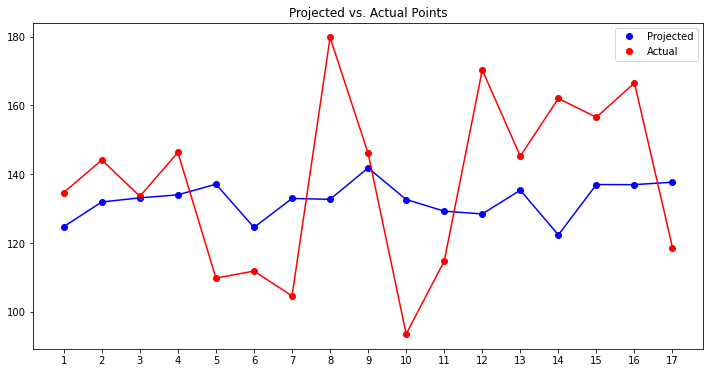

In [79]:
plot_data = team_starters_df[['Week','Projected','Actual']].groupby(['Week']).sum().reset_index()

plt.figure(figsize=(12, 6))
plt.plot(plot_data['Week'], plot_data['Projected'], 'bo', label = 'Projected')
plt.plot(plot_data['Week'], plot_data['Actual'], 'ro', label = 'Actual')
plt.plot(plot_data['Week'], plot_data['Projected'], 'b-')
plt.plot(plot_data['Week'], plot_data['Actual'], 'r-')

plt.title('Projected vs. Actual Points')
plt.legend()
plt.xticks(plot_data['Week'])
plt.show()


In [80]:
# create a function to do it for each team
def plot_team(df, team_abbrev):
    df2 = df[df['Team'] == team_abbrev]
    
    plot_data = df2[['Week','Projected','Actual']].groupby(['Week']).sum().reset_index()

    plt.figure(figsize=(12, 6))
    plt.plot(plot_data['Week'], plot_data['Projected'], 'bo', label = 'Projected')
    plt.plot(plot_data['Week'], plot_data['Actual'], 'ro', label = 'Actual')
    plt.plot(plot_data['Week'], plot_data['Projected'], 'b-')
    plt.plot(plot_data['Week'], plot_data['Actual'], 'r-')

    plt.title('Projected vs. Actual Points')
    plt.legend()
    plt.xticks(plot_data['Week'])
    plt.show()

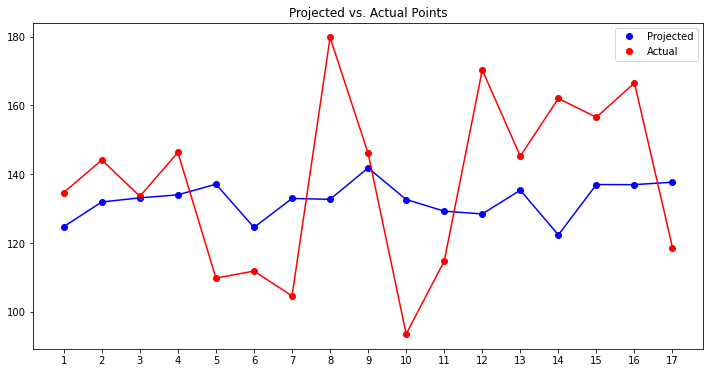

In [81]:
plot_team(starters_df, 'JEFFREY')

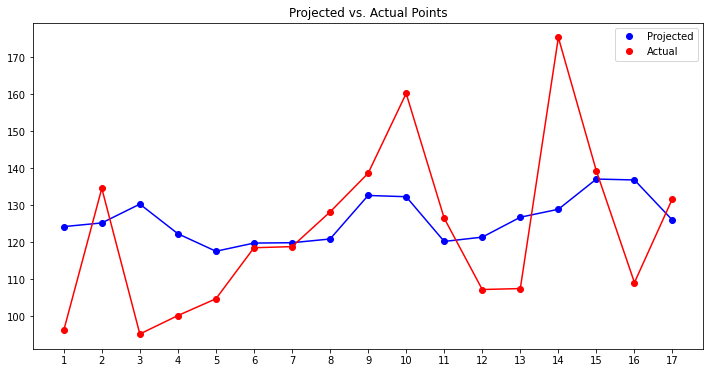

In [82]:
plot_team(starters_df, 'ZACH')

# Quantifying the Difference in Projections & Actuals

In [83]:
# create a function to get the difference of projections and actuals
def calc_difference(df):
    return df['Projected'].sum() - df['Actual'].sum()

In [84]:
# use the starters df and groupby team and apply the function
team_df = starters_df.groupby(['Team']).apply(calc_difference)

In [85]:
with pd.option_context('display.max_rows', None, 'display.max_columns', None):
    print(round(team_df),2)

Team
ALEX        -1.0
BBQ         57.0
BUG       -142.0
DAVID       39.0
FEF        250.0
HOT        -57.0
HZSB        38.0
JEFFREY    -86.0
LG         -27.0
ZACH        50.0
dtype: float64 2


In [86]:
# sort it by best to worst
with pd.option_context('display.max_rows', None, 'display.max_columns', None):
    print(round(team_df.sort_values()),2)

Team
BUG       -142.0
JEFFREY    -86.0
HOT        -57.0
LG         -27.0
ALEX        -1.0
HZSB        38.0
DAVID       39.0
ZACH        50.0
BBQ         57.0
FEF        250.0
dtype: float64 2


## Breakdown by Week, Position, and Player

In [87]:
weekly_final_df = starters_df.groupby(['Team', 'Week']).apply(calc_difference)
position_final_df = starters_df.groupby(['Team', 'Position']).apply(calc_difference)
player_final_df = starters_df.groupby(['Team', 'Player']).apply(calc_difference)

In [88]:
with pd.option_context('display.max_rows', None, 'display.max_columns', None):
    print(round(weekly_final_df),2)

Team     Week
ALEX     1       -7.0
         2       -7.0
         3        8.0
         4      -21.0
         5      -13.0
         6      -26.0
         7        5.0
         8        3.0
         9       21.0
         10      29.0
         11      29.0
         12      19.0
         13      -1.0
         14      20.0
         15      11.0
         16     -40.0
         17     -32.0
BBQ      1        3.0
         2       13.0
         3        7.0
         4        1.0
         5       -5.0
         6        6.0
         7      -17.0
         8       11.0
         9      -18.0
         10      39.0
         11      28.0
         12     -39.0
         13     -10.0
         14      -4.0
         15      51.0
         16     -11.0
         17      -0.0
BUG      1       34.0
         2      -14.0
         3        5.0
         4       10.0
         5       -1.0
         6      -29.0
         7        3.0
         8       -4.0
         9      -13.0
         10     -16.0
         11     -2

In [89]:
with pd.option_context('display.max_rows', None, 'display.max_columns', None):
    print(round(position_final_df),2)

Team     Position
ALEX     D/ST        -14.0
         Flex        -53.0
         IR            0.0
         K           -55.0
         QB          -10.0
         RB           39.0
         TE            1.0
         WR           90.0
BBQ      D/ST        -13.0
         Flex         39.0
         IR           22.0
         K             6.0
         QB           15.0
         RB          -63.0
         TE           49.0
         WR            2.0
BUG      D/ST        -60.0
         Flex        -31.0
         IR           18.0
         K            22.0
         QB          -10.0
         RB          -28.0
         TE          -50.0
         WR           -4.0
DAVID    D/ST         -6.0
         Flex         30.0
         IR           -2.0
         K           -23.0
         QB           11.0
         RB           43.0
         TE            2.0
         WR          -16.0
FEF      D/ST        -38.0
         Flex         11.0
         IR           15.0
         K            -2.0
         Q

In [90]:
with pd.option_context('display.max_rows', None, 'display.max_columns', None):
    print(round(player_final_df),2)

Team     Player               
ALEX     Alvin Kamara             24.0
         Anthony Richardson        0.0
         Baker Mayfield          -55.0
         Brandon Aiyuk            25.0
         Brandon Aubrey          -31.0
         Brian Thomas Jr.          9.0
         Brock Purdy               5.0
         Bucky Irving             -5.0
         Cameron Dicker          -18.0
         Chris Olave              13.0
         Cole Kmet               -17.0
         Commanders D/ST           0.0
         DK Metcalf               22.0
         David Montgomery         -4.0
         Harrison Butker           1.0
         James Conner              5.0
         Jameson Williams         -5.0
         Jayden Reed              23.0
         Jets D/ST                12.0
         Jonathan Taylor           3.0
         Jordan Love              25.0
         Kenneth Walker III      -29.0
         Ladd McConkey           -20.0
         Michael Pittman Jr.      17.0
         Packers D/ST            

In [91]:
# just look at my team
jeffrey_player_df = starters_df[starters_df['Team'] == 'JEFFREY'].groupby(['Player']).apply(calc_difference)

In [92]:
with pd.option_context('display.max_rows', None, 'display.max_columns', None):
    print(round(jeffrey_player_df.sort_values()),2)

Player
Chase Brown        -28.0
Vikings D/ST       -20.0
Jared Goff         -18.0
Courtland Sutton   -16.0
Brandon Aubrey     -15.0
Nico Collins       -11.0
Broncos D/ST       -10.0
Brock Purdy        -10.0
Brian Thomas Jr.    -9.0
Raiders D/ST        -6.0
Pat Freiermuth      -6.0
Jaylen Waddle       -6.0
Wil Lutz            -4.0
Tank Dell           -2.0
David Montgomery    -2.0
Diontae Johnson     -2.0
De'Von Achane       -1.0
Khalil Shakir        0.0
Hollywood Brown      0.0
Evan McPherson       4.0
Antonio Gibson       5.0
Bengals D/ST         5.0
Kyle Pitts           6.0
Hunter Henry        11.0
CeeDee Lamb         14.0
Kyren Williams      17.0
Jayden Daniels      19.0
dtype: float64 2


# Advanced Plotting

In [93]:
slotcodes = {
    0 : 'QB', 1 : 'QB',
    2 : 'RB', 3 : 'RB',
    4 : 'WR', 5 : 'WR',
    6 : 'TE', 7 : 'TE',
    16: 'D/ST',
    17: 'K',
    20: 'Bench',
    21: 'IR',
    23: 'Flex'
}

In [94]:
def get_matchups(league_id, season, week, swid='', espn=''):
    ''' 
    Pull full JSON of matchup data from ESPN API for a particular week.
    '''
    
    url = 'https://lm-api-reads.fantasy.espn.com/apis/v3/games/ffl/seasons/' + \
      str(season) + '/segments/0/leagues/' + str(league_id)

    r = requests.get(url + '?view=mMatchup&view=mMatchupScore',
                     params={'scoringPeriodId': week, 'matchupPeriodId': week},
                     cookies={"SWID": swid, "espn_s2": espn_s2})
    return r.json()

In [95]:
def get_slates(json):
    '''
    Constructs week team slates with slotted position, 
    position, and points (actual and ESPN projected),
    given full matchup info (`get_matchups`)
    '''
    
    slates = {}

    for team in d['teams']:
        slate = []
        for p in team['roster']['entries']:
            # get name
            name  = p['playerPoolEntry']['player']['fullName']

            # get actual lineup slot
            slotid = p['lineupSlotId']
            slot = slotcodes[slotid]

            # get projected and actual scores
            act, proj = 0, 0
            for stat in p['playerPoolEntry']['player']['stats']:
                if stat['scoringPeriodId'] != week:
                    continue
                if stat['statSourceId'] == 0:
                    act = stat['appliedTotal']
                elif stat['statSourceId'] == 1:
                    proj = stat['appliedTotal']
                else:
                    print('Error')

            # get type of player
            pos = 'Unk'
            ess = p['playerPoolEntry']['player']['eligibleSlots']
            if 0 in ess: pos = 'QB'
            elif 2 in ess: pos = 'RB'
            elif 4 in ess: pos = 'WR'
            elif 6 in ess: pos = 'TE'
            elif 16 in ess: pos = 'D/ST'
            elif 17 in ess: pos = 'K'

            slate.append([name, slotid, slot, pos, act, proj])

        slate = pd.DataFrame(slate, columns=['Name', 'SlotID', 'Slot', 'Pos', 'Actual', 'Proj'])
        slates[team['id']] = slate

    return slates

In [96]:
def compute_pts(slates, posns, struc):
    '''
    Given slates (`get_slates`), compute total roster pts:
    actual, optimal, and using ESPN projections
    
    Parameters
    --------------
    slates : `dict` of `DataFrames`
        (from `get_slates`)
    posns : `list`
        roster positions, e.g. ['QB','RB', 'WR', 'TE']
    struc : `list`
        slots per position, e.g. [1,2,2,1]
        
    * This is not flexible enough to handle "weird" leagues
    like 6 Flex slots with constraints on # total RB/WR
    
    Returns
    --------------
    `dict` of `dict`s with actual, ESPN, optimal points
    '''
    
    data = {}
    for tmid, slate in slates.items():
        pts = {'epts': 0, 'apts': 0}

        # ACTUAL STARTERS
        pts['apts'] = slate.query('Slot not in ["Bench", "IR"]').filter(['Actual']).sum().values[0]

        # PROJECTED STARTERS
        pts['epts'] = slate.query('Slot not in ["Bench", "IR"]').filter(['Proj']).sum().values[0]

        
        data[tmid] = pts
        
    return data

In [97]:
def get_teamnames(league_id, season, week, swid='', espn=''):
    url = 'https://lm-api-reads.fantasy.espn.com/apis/v3/games/ffl/seasons/' + \
      str(season) + '/segments/0/leagues/' + str(league_id)
    
    r = requests.get(url + '?view=mTeam',
                  params={'scoringPeriodId': week},
                  cookies={"SWID": swid, "espn_s2": espn_s2})
    d = r.json()
    
    tm_names = {tm['id']: (tm.get('location', '').strip() + ' ' + tm.get('nickname', '').strip()).strip()
        for tm in d.get('teams', [])}
    
    return tm_names

In [98]:
# only plot actual and projected for a given week
def plot_week(d, data, week, tm_names, nummatchups=5, 
              minx=70, maxx=200, legend=4):
    fig, ax = plt.subplots(1,1, figsize=(12,8))

    # hardcoded plot adjustments
    dif, offset = 5, 2
    
    # for y-axis tick labels
    tmlist, tmticks, tmbold = [], [], []

    cury = 0
    for g in d['schedule'][:nummatchups]:
        aid, anm = -1, ''
        hid, hnm = -1, ''
        try:
            aid = g['away']['teamId']
            anm = tm_names[aid]
            hid = g['home']['teamId']
            hnm = tm_names[hid]
        except:
            continue

        tmlist.append(anm)
        tmlist.append(hnm)

        if data[aid]['apts'] > data[hid]['apts']:
            tmbold.extend([1,0])
        else:
            tmbold.extend([0,1])

        for pts in [data[aid], data[hid]]:
            #h = 1 if (pts['opts']-offset) > pts['apts'] else 0
            tmticks.append(cury)
            ax.plot([minx, maxx], [cury, cury], 'k--', linewidth=1, alpha=0.1)
            #ax.plot([pts['apts'], pts['opts']-offset*h], [cury, cury], 'k-')
            ax.scatter(pts['epts'], cury, c='w', s=200, marker='o', edgecolor='g')
            ax.scatter(pts['apts'], cury, c='k', s=100)

            # if optimal==actual, need to put blue inside black
            #if pts['opts'] == pts['apts']:
                #ax.scatter(pts['opts'], cury, c='w', s=25)
                #ax.scatter(pts['opts'], cury, c='b', s=25, alpha=0.2)
            #else:
                #ax.scatter(pts['opts'], cury, c='b', s=100, alpha=0.2)

            cury += dif

        cury += 2*dif

    # setting y-axis
    ax.set(yticks=tmticks,
           yticklabels=tmlist)
    for k, tick in enumerate(ax.yaxis.get_major_ticks()):
        if tmbold[k] == 1:
            tick.label1.set_fontweight('bold')

    # legend stuff
    ax.scatter([],[], c='k', s=100, label='Actual')
    ax.scatter([],[], c='w', s=200, marker='o', edgecolor='g', label='ESPN')
    #ax.scatter([],[], c='b', s=100, alpha=0.2, label='Best Possible')
    ax.legend(loc=legend, borderaxespad=2, borderpad=1, labelspacing=1.5, 
              shadow=True, fontsize=12)

    ax.set(title='Week %d' % week)

    return ax

In [99]:
league_id = 708983404

season = 2024
week = 1
posns = ['QB', 'RB', 'WR', 'Flex', 'TE', 'D/ST', 'K']
struc = [1,2,2,1,1,1,1]

d      = get_matchups(league_id, season, week, swid=swid, espn=espn_s2)
slates = get_slates(d)
wdata  = compute_pts(slates, posns, struc)
tms    = get_teamnames(league_id, season, week, swid=swid, espn=espn_s2)

In [100]:
tms = {
    1: 'ZACH',
    2: 'BBQ',
    3: 'LG',
    4: 'ALEX',
    5: 'HZSB',
    6: 'JEFFREY',
    7: 'HOT',
    8: 'BUG',
    9: 'FEF',
    10: 'DAVID'
}

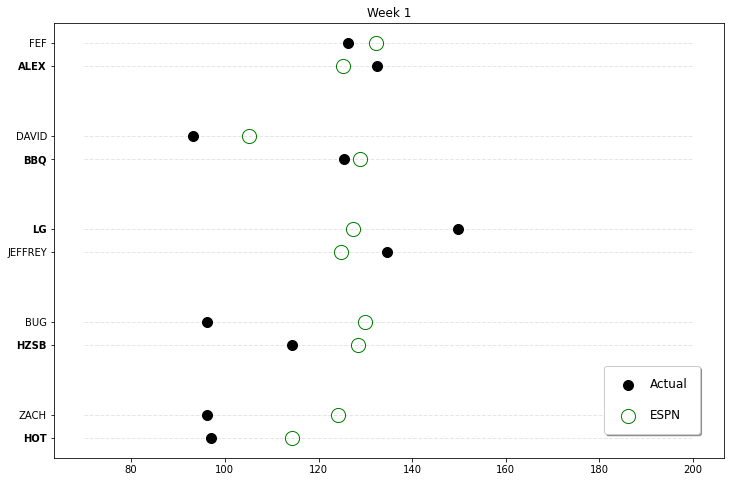

In [101]:
ax = plot_week(d, wdata, week, tms, nummatchups=5)
plt.show()